# Spatial Autocorrelation

In this notebook I will perform spatial autocorrelation analysis on the building permits for new buildings throughout NYC.

In [1]:
import pandas as pd
import geopandas as gpd
import sodapy
from sodapy import Socrata
import matplotlib.pyplot as plt
from shapely.geometry import Point
import contextily as ctx

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


## Permit Data

Using the NYC open data API to access the building permit data as in the last notebook.

In [2]:
client = Socrata("data.cityofnewyork.us", '9llM0ejMVTKfRxS1XlvL7gXjU')

In [3]:
permits = client.get("ipu4-2q9a", content_type='json', 
                     select = 'borough, bin__, job_type, block, bldg_type, permit_status, filing_status, permit_type, filing_date, issuance_date, expiration_date, job_start_date, gis_latitude, gis_longitude, gis_census_tract, gis_nta_name',  
                     where = 'permit_type == "NB"', 
                     limit = 300000)

In [4]:
permitdata = pd.DataFrame.from_records(permits)

In [5]:
permitdata.head()

,borough,bin__,job_type,block,bldg_type,permit_status,filing_status,permit_type,filing_date,issuance_date,expiration_date,job_start_date,gis_latitude,gis_longitude,gis_census_tract,gis_nta_name
0,MANHATTAN,1090470,NB,00439,2,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,03/25/2021,10/08/2015,40.729493,-73.982328,34,East Village
1,BROOKLYN,3000519,NB,00166,2,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,09/20/2020,12/07/2018,40.687759,-73.982898,37,DUMBO-Vinegar Hill-Downtown Brooklyn-Boerum Hill
2,BRONX,2130661,NB,05937,2,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,05/06/2021,01/28/2020,NaN,NaN,NaN,NaN
3,BROOKLYN,3428681,NB,06319,1,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,03/19/2021,06/24/2019,40.603089,-73.991091,296,Bensonhurst West
4,BROOKLYN,3428682,NB,06319,1,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,03/19/2021,06/24/2019,40.603051,-73.991029,296,Bensonhurst West


Converting the latitude, longitude, and census tracts to numeric data formats.

In [6]:
permitdata.columns

Index(['borough', 'bin__', 'job_type', 'block', 'bldg_type', 'permit_status',
       'filing_status', 'permit_type', 'filing_date', 'issuance_date',
       'expiration_date', 'job_start_date', 'gis_latitude', 'gis_longitude',
       'gis_census_tract', 'gis_nta_name'],
      dtype='object')

In [7]:
for column in ['gis_latitude', 'gis_longitude', 'gis_census_tract']:
    permitdata[column] = pd.to_numeric(permitdata[column], errors='coerce')

In [8]:
permitdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 246585 entries, 0 to 246584
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   borough           246585 non-null  object 
 1   bin__             246585 non-null  object 
 2   job_type          246585 non-null  object 
 3   block             246575 non-null  object 
 4   bldg_type         245193 non-null  object 
 5   permit_status     245379 non-null  object 
 6   filing_status     246585 non-null  object 
 7   permit_type       246585 non-null  object 
 8   filing_date       246584 non-null  object 
 9   issuance_date     245345 non-null  object 
 10  expiration_date   246223 non-null  object 
 11  job_start_date    246579 non-null  object 
 12  gis_latitude      243975 non-null  float64
 13  gis_longitude     243975 non-null  float64
 14  gis_census_tract  243975 non-null  float64
 15  gis_nta_name      243975 non-null  object 
dtypes: float64(3), objec

Dropping the permits that do not have locations (either the lat and lon locations, or those that do not have a census tract listed).

In [9]:
permitdata = permitdata.dropna(subset=['gis_longitude','gis_latitude', 'gis_census_tract'])

In [10]:
permitdata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 243975 entries, 0 to 246584
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   borough           243975 non-null  object 
 1   bin__             243975 non-null  object 
 2   job_type          243975 non-null  object 
 3   block             243965 non-null  object 
 4   bldg_type         242586 non-null  object 
 5   permit_status     242777 non-null  object 
 6   filing_status     243975 non-null  object 
 7   permit_type       243975 non-null  object 
 8   filing_date       243974 non-null  object 
 9   issuance_date     242746 non-null  object 
 10  expiration_date   243616 non-null  object 
 11  job_start_date    243969 non-null  object 
 12  gis_latitude      243975 non-null  float64
 13  gis_longitude     243975 non-null  float64
 14  gis_census_tract  243975 non-null  float64
 15  gis_nta_name      243975 non-null  object 
dtypes: float64(3), objec

Adding in a geometry column for when the geodataframe is created.

In [11]:
permitdata['geometry'] = [Point(xy) for xy in zip(permitdata['gis_longitude'], permitdata['gis_latitude'])]

In [12]:
permitdata.head()

,borough,bin__,job_type,block,bldg_type,permit_status,filing_status,permit_type,filing_date,issuance_date,expiration_date,job_start_date,gis_latitude,gis_longitude,gis_census_tract,gis_nta_name,geometry
0,MANHATTAN,1090470,NB,00439,2,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,03/25/2021,10/08/2015,40.729493,-73.982328,34.0,East Village,POINT (-73.982328 40.729493)
1,BROOKLYN,3000519,NB,00166,2,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,09/20/2020,12/07/2018,40.687759,-73.982898,37.0,DUMBO-Vinegar Hill-Downtown Brooklyn-Boerum Hill,POINT (-73.98289800000001 40.687759)
3,BROOKLYN,3428681,NB,06319,1,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,03/19/2021,06/24/2019,40.603089,-73.991091,296.0,Bensonhurst West,POINT (-73.991091 40.603089)
4,BROOKLYN,3428682,NB,06319,1,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,03/19/2021,06/24/2019,40.603051,-73.991029,296.0,Bensonhurst West,POINT (-73.991029 40.603051)
5,MANHATTAN,1090833,NB,00764,2,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,10/01/2020,11/01/2018,40.739167,-74.001119,81.0,Hudson Yards-Chelsea-Flatiron-Union Square,POINT (-74.001119 40.739167)


Converting the data to a geodataframe

In [13]:
permitsgdf= gpd.GeoDataFrame(permitdata, crs='EPSG:4326')

In [14]:
permitsgdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 243975 entries, 0 to 246584
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   borough           243975 non-null  object  
 1   bin__             243975 non-null  object  
 2   job_type          243975 non-null  object  
 3   block             243965 non-null  object  
 4   bldg_type         242586 non-null  object  
 5   permit_status     242777 non-null  object  
 6   filing_status     243975 non-null  object  
 7   permit_type       243975 non-null  object  
 8   filing_date       243974 non-null  object  
 9   issuance_date     242746 non-null  object  
 10  expiration_date   243616 non-null  object  
 11  job_start_date    243969 non-null  object  
 12  gis_latitude      243975 non-null  float64 
 13  gis_longitude     243975 non-null  float64 
 14  gis_census_tract  243975 non-null  float64 
 15  gis_nta_name      243975 non-null  object  

In [15]:
permitsgdf.head()

,borough,bin__,job_type,block,bldg_type,permit_status,filing_status,permit_type,filing_date,issuance_date,expiration_date,job_start_date,gis_latitude,gis_longitude,gis_census_tract,gis_nta_name,geometry
0,MANHATTAN,1090470,NB,00439,2,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,03/25/2021,10/08/2015,40.729493,-73.982328,34.0,East Village,POINT (-73.98233 40.72949)
1,BROOKLYN,3000519,NB,00166,2,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,09/20/2020,12/07/2018,40.687759,-73.982898,37.0,DUMBO-Vinegar Hill-Downtown Brooklyn-Boerum Hill,POINT (-73.98290 40.68776)
3,BROOKLYN,3428681,NB,06319,1,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,03/19/2021,06/24/2019,40.603089,-73.991091,296.0,Bensonhurst West,POINT (-73.99109 40.60309)
4,BROOKLYN,3428682,NB,06319,1,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,03/19/2021,06/24/2019,40.603051,-73.991029,296.0,Bensonhurst West,POINT (-73.99103 40.60305)
5,MANHATTAN,1090833,NB,00764,2,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,10/01/2020,11/01/2018,40.739167,-74.001119,81.0,Hudson Yards-Chelsea-Flatiron-Union Square,POINT (-74.00112 40.73917)


In [16]:
permitsgdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [17]:
import datetime

In [18]:
permitsgdf['job_start_date'] = pd.to_datetime(permitsgdf['job_start_date'])

Cutting down the dataset to only contain those new buildings that were commenced between the end of Hurricane Sandy, November 2, 2012, and 2030, which appears to be the most realistic projected start date for the upper end of the dataset (there are start dates of 2099 and up that I have decided to exclude).

In [19]:
post_sandy_permitsgdf = permitsgdf[(permitsgdf['job_start_date']>'2012-11-02') & 
(permitsgdf['job_start_date']<'2030-12-31')]

In [20]:
post_sandy_permitsgdf.sort_values('job_start_date')

,borough,bin__,job_type,block,bldg_type,permit_status,filing_status,permit_type,filing_date,issuance_date,expiration_date,job_start_date,gis_latitude,gis_longitude,gis_census_tract,gis_nta_name,geometry
101760,BRONX,2127343,NB,03436,1,ISSUED,INITIAL,NB,2012-11-07,2012-11-07,2013-07-01,2012-11-07,40.807217,-73.850792,4.0,Soundview-Castle Hill-Clason Point-Harding Park,POINT (-73.85079 40.80722)
66055,BRONX,2127342,NB,03436,1,ISSUED,RENEWAL,NB,2013-06-27,2013-06-27,2014-06-27,2012-11-07,40.807239,-73.850839,4.0,Soundview-Castle Hill-Clason Point-Harding Park,POINT (-73.85084 40.80724)
86768,STATEN ISLAND,5158969,NB,06333,1,ISSUED,RENEWAL,NB,2014-04-15,2014-04-15,2015-03-10,2012-11-07,40.536901,-74.192651,17009.0,Arden Heights,POINT (-74.19265 40.53690)
58165,BRONX,2127342,NB,03436,1,ISSUED,RENEWAL,NB,2014-06-20,2014-06-20,2015-06-20,2012-11-07,40.807239,-73.850839,4.0,Soundview-Castle Hill-Clason Point-Harding Park,POINT (-73.85084 40.80724)
59202,STATEN ISLAND,5158962,NB,06333,1,ISSUED,RENEWAL,NB,2013-03-08,2013-03-08,2014-03-08,2012-11-07,40.536935,-74.192536,17009.0,Arden Heights,POINT (-74.19254 40.53693)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2745,BRONX,2816717,NB,02752,2,ISSUED,INITIAL,NB,08/12/2020,08/12/2020,01/25/2021,2025-08-12,40.827879,-73.889965,12101.0,Morrisania-Melrose,POINT (-73.88997 40.82788)
110227,BROOKLYN,3421407,NB,03143,2,ISSUED,INITIAL,NB,2017-08-22,2017-08-22,2018-08-22,2027-08-22,40.702198,-73.933729,425.0,Bushwick South,POINT (-73.93373 40.70220)
225716,BROOKLYN,3421407,NB,03143,2,ISSUED,RENEWAL,NB,2018-09-04,2018-09-04,2019-09-04,2027-08-22,40.702198,-73.933729,425.0,Bushwick South,POINT (-73.93373 40.70220)
102929,BROOKLYN,3388038,NB,01708,1,ISSUED,INITIAL,NB,2003-01-17,2003-01-17,2003-11-15,2030-01-17,40.678436,-73.927880,299.0,Crown Heights North,POINT (-73.92788 40.67844)


In [21]:
post_sandy_permitsgdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 54043 entries, 0 to 246584
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   borough           54043 non-null  object        
 1   bin__             54043 non-null  object        
 2   job_type          54043 non-null  object        
 3   block             54043 non-null  object        
 4   bldg_type         54043 non-null  object        
 5   permit_status     53987 non-null  object        
 6   filing_status     54043 non-null  object        
 7   permit_type       54043 non-null  object        
 8   filing_date       54043 non-null  object        
 9   issuance_date     53776 non-null  object        
 10  expiration_date   53838 non-null  object        
 11  job_start_date    54043 non-null  datetime64[ns]
 12  gis_latitude      54043 non-null  float64       
 13  gis_longitude     54043 non-null  float64       
 14  gis_census_tr

After sorting for only those new buildings that were first permitted after Hurricane Sandy, we are left with roughly 54,000 entries.  It will be interesting to see where these buildings are located, and to see if there is any correlation with damage from Hurricane Sandy or projected sea level rise.

## Census Tract Data

In another notebook I performed the spatial join and value count analyses for all buildings in each census tract, not just the building permits.  I did this so that we could normalize the number of building permits per tract as a function of the total number of buildings in each tract.  I had to perform this work in another notebook due to the size of the dataset on NYC buildings, but the code can be found here: https://jupyter.idre.ucla.edu/user/jjbasinger@me.com/doc/tree/up206a-jacob/nyc%20all%20buildings%20as%20points.ipynb. I created this notebook first without normalizing the data on new building permits, but decided that it would work better if I compared the permits to the total number of buildings.

The census tract data is separated by borough, since census tract numbers repeat between them.

In [22]:
mtracts = gpd.read_file('../up206a-jacob/manhattan_buildings_and_tracts.json')
bktracts = gpd.read_file('../up206a-jacob/brooklyn_buildings_and_tracts.json')
bxtracts = gpd.read_file('../up206a-jacob/bronx_buildings_and_tracts.json')
sitracts = gpd.read_file('../up206a-jacob/statenisland_buildings_and_tracts.json')
qtracts = gpd.read_file('../up206a-jacob/queens_buildings_and_tracts.json')

In [23]:
for borough in [mtracts, bktracts, bxtracts, sitracts, qtracts]:
    print(borough.crs)

epsg:4326
epsg:4326
epsg:4326
epsg:4326
epsg:4326


Converting the census_tract (FIPS code) information to a number to match the census tract data in the permits dataset.

In [24]:
for borough in [mtracts, bktracts, bxtracts, sitracts, qtracts]:
    borough['census_tract'] = borough['census_tract'].astype('float')

In [25]:
for borough in [mtracts, bktracts, bxtracts, sitracts, qtracts]:
    borough.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 310 entries, 0 to 309
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   borough          310 non-null    object  
 1   census_tract     310 non-null    float64 
 2   Shape__Area      310 non-null    float64 
 3   Shape__Length    310 non-null    float64 
 4   buildings_count  310 non-null    int64   
 5   geometry         310 non-null    geometry
dtypes: float64(3), geometry(1), int64(1), object(1)
memory usage: 14.7+ KB
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 803 entries, 0 to 802
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   borough          803 non-null    object  
 1   census_tract     803 non-null    float64 
 2   Shape__Area      803 non-null    float64 
 3   Shape__Length    803 non-null    float64 
 4   buildings_count  803 non-null    int6

In [26]:
mtracts.head()

,borough,census_tract,Shape__Area,Shape__Length,buildings_count,geometry
0,Manhattan,100.0,1.844391e+06,11022.881944,23,"MULTIPOLYGON (((-74.04388 40.69020, -74.04351 ..."
1,Manhattan,201.0,9.723121e+05,4754.494868,41,"POLYGON ((-73.98450 40.70952, -73.98655 40.709..."
2,Manhattan,202.0,3.315114e+06,8568.089568,77,"MULTIPOLYGON (((-73.98364 40.70960, -73.98450 ..."
3,Manhattan,500.0,9.083181e+06,32641.900715,137,"MULTIPOLYGON (((-74.01093 40.68450, -74.01193 ..."
4,Manhattan,600.0,2.582705e+06,6976.286329,180,"POLYGON ((-73.99022 40.71441, -73.98934 40.714..."


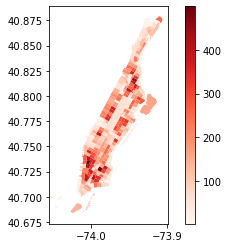

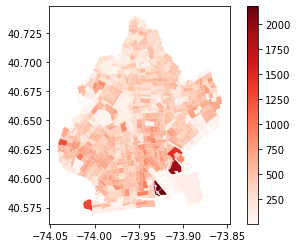

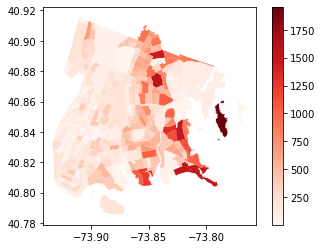

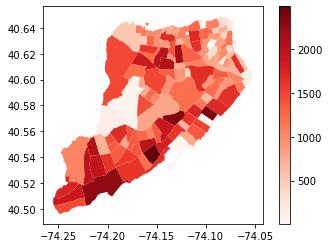

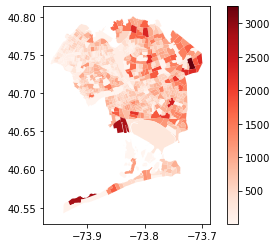

In [27]:
for borough in [mtracts, bktracts, bxtracts, sitracts, qtracts]:
    borough.plot(column='buildings_count', cmap='Reds', legend=True)

We now have a geodataframe of all of the census tracts in New York City by borough (along with the number of buildings in each census tract as a result of the other notebook).

## Join

Next we joined the permits data with the census tract data for each borough.

In [28]:
mjoingdf = gpd.sjoin(post_sandy_permitsgdf, mtracts)
bkjoingdf = gpd.sjoin(post_sandy_permitsgdf, bktracts)
bxjoingdf = gpd.sjoin(post_sandy_permitsgdf, bxtracts)
sijoingdf = gpd.sjoin(post_sandy_permitsgdf, sitracts)
qjoingdf = gpd.sjoin(post_sandy_permitsgdf, qtracts)

In [29]:
mjoingdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 5200 entries, 0 to 245381
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   borough_left      5200 non-null   object        
 1   bin__             5200 non-null   object        
 2   job_type          5200 non-null   object        
 3   block             5200 non-null   object        
 4   bldg_type         5200 non-null   object        
 5   permit_status     5184 non-null   object        
 6   filing_status     5200 non-null   object        
 7   permit_type       5200 non-null   object        
 8   filing_date       5200 non-null   object        
 9   issuance_date     5174 non-null   object        
 10  expiration_date   5181 non-null   object        
 11  job_start_date    5200 non-null   datetime64[ns]
 12  gis_latitude      5200 non-null   float64       
 13  gis_longitude     5200 non-null   float64       
 14  gis_census_tra

In [30]:
mjoingdf.head()

,borough_left,bin__,job_type,block,bldg_type,permit_status,filing_status,permit_type,filing_date,issuance_date,...,gis_longitude,gis_census_tract,gis_nta_name,geometry,index_right,borough_right,census_tract,Shape__Area,Shape__Length,buildings_count
0,MANHATTAN,1090470,NB,00439,2,ISSUED,RENEWAL,NB,06/17/2020,06/17/2020,...,-73.982328,34.0,East Village,POINT (-73.98233 40.72949),35,Manhattan,3400.0,1.718451e+06,5503.30704,378
1403,MANHATTAN,1090211,NB,00441,2,ISSUED,RENEWAL,NB,05/24/2019,05/24/2019,...,-73.982194,34.0,East Village,POINT (-73.98219 40.73029),35,Manhattan,3400.0,1.718451e+06,5503.30704,378
3926,MANHATTAN,1091652,NB,00406,2,ISSUED,RENEWAL,NB,10/05/2020,10/05/2020,...,-73.981000,34.0,East Village,POINT (-73.98100 40.72951),35,Manhattan,3400.0,1.718451e+06,5503.30704,378
4300,MANHATTAN,1091639,NB,00406,2,ISSUED,INITIAL,NB,06/24/2020,06/24/2020,...,-73.980405,34.0,East Village,POINT (-73.98041 40.72871),35,Manhattan,3400.0,1.718451e+06,5503.30704,378
4303,MANHATTAN,1091639,NB,00406,2,ISSUED,RENEWAL,NB,10/05/2020,10/05/2020,...,-73.980405,34.0,East Village,POINT (-73.98041 40.72871),35,Manhattan,3400.0,1.718451e+06,5503.30704,378


Then we created new datasets of just the number of permits in each census tract.

In [31]:
permits_by_mtracts = mjoingdf.census_tract.value_counts().rename_axis('census_tract').reset_index(name='permits_count')
permits_by_bktracts = bkjoingdf.census_tract.value_counts().rename_axis('census_tract').reset_index(name='permits_count')
permits_by_bxtracts = bxjoingdf.census_tract.value_counts().rename_axis('census_tract').reset_index(name='permits_count')
permits_by_sitracts = sijoingdf.census_tract.value_counts().rename_axis('census_tract').reset_index(name='permits_count')
permits_by_qtracts = qjoingdf.census_tract.value_counts().rename_axis('census_tract').reset_index(name='permits_count')

In [32]:
permits_by_mtracts.head()

,census_tract,permits_count
0,9901.0,126
1,9500.0,120
2,9903.0,116
3,3700.0,107
4,11100.0,98


<AxesSubplot:xlabel='census_tract'>

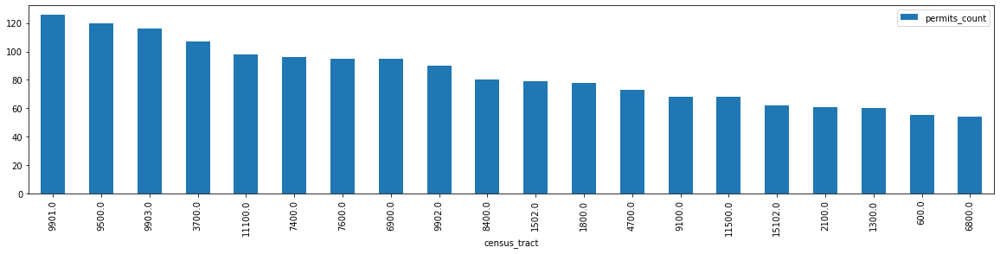

In [33]:
permits_by_mtracts[:20].plot.bar(figsize=(20,4),
                             x='census_tract',
                             y='permits_count')

Finally, we merged the permits by tract data with the census tracts data in order to visualize which census tracts have the most new buildings.

In [34]:
mtracts = mtracts.merge(permits_by_mtracts, on='census_tract')
bktracts = bktracts.merge(permits_by_bktracts, on='census_tract')
bxtracts = bxtracts.merge(permits_by_bxtracts, on='census_tract')
sitracts = sitracts.merge(permits_by_sitracts, on='census_tract')
qtracts = qtracts.merge(permits_by_qtracts, on='census_tract')

Below you can see the number of new building permits for each census tract since Hurricane Sandy, plotted by borough.

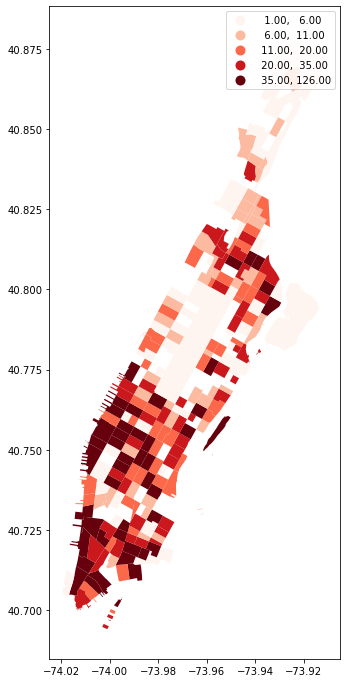

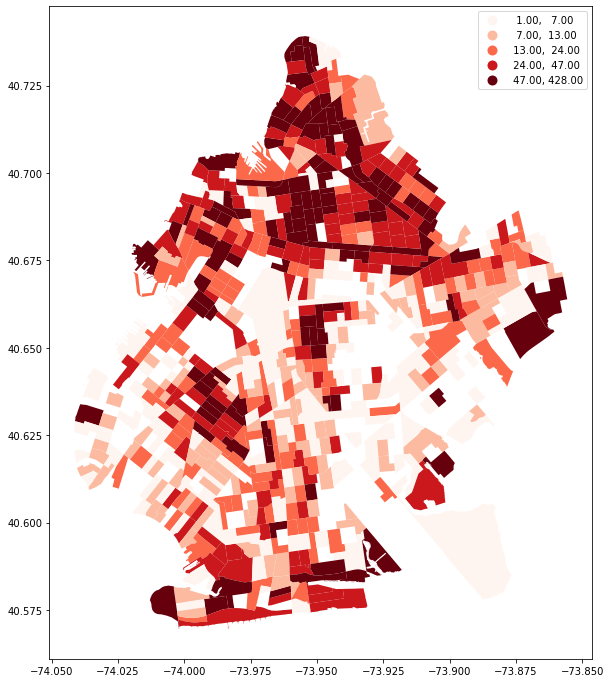

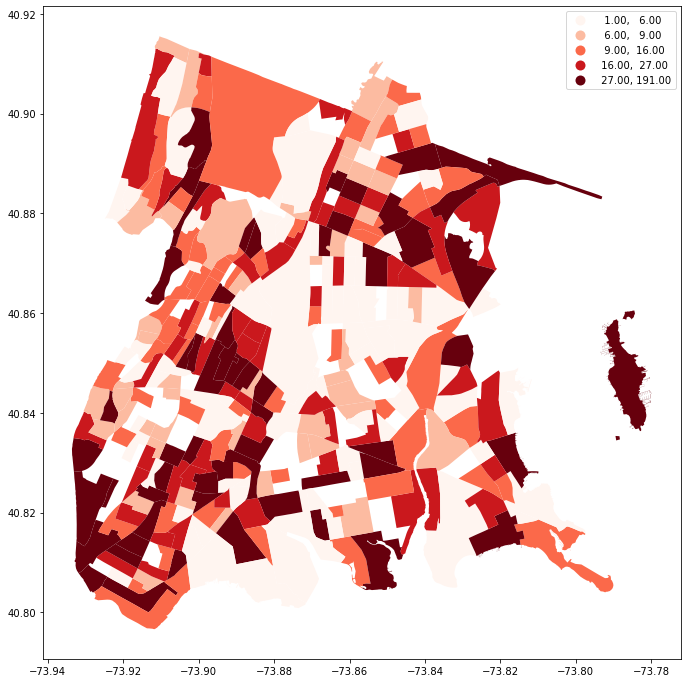

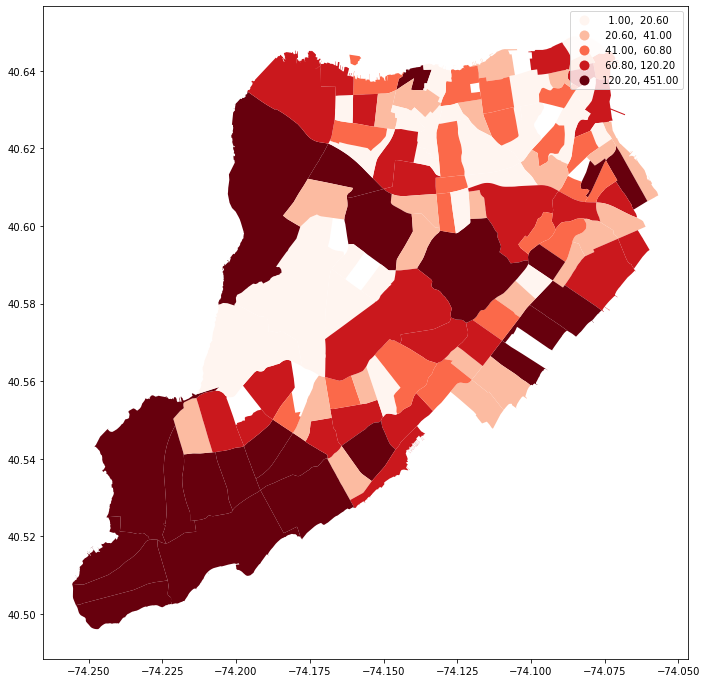

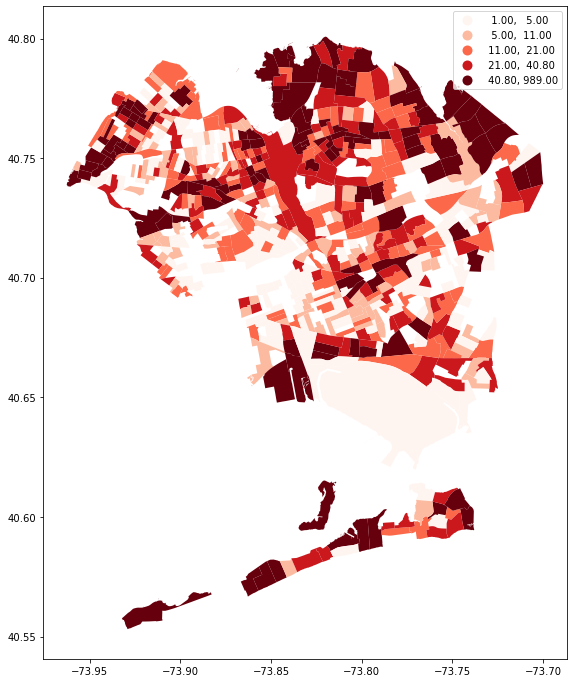

In [35]:
for borough in [mtracts, bktracts, bxtracts, sitracts, qtracts]:
    borough.plot(column='permits_count', scheme='quantiles', cmap='Reds', legend=True, figsize=(12,12))

## Normalizing the Permit Data

We created a column with the number of new building permits normalized by number of buildings per tract.

In [36]:
for borough in [mtracts, bktracts, bxtracts, sitracts, qtracts]:
    borough['permits per 100 buildings'] = borough['permits_count'] / borough['buildings_count'] * 100

This gives us a column with data that shows how many new building permits there are per 100 buildings in each census tract. Now we can look at the data in a normalized fashion in order to better compare it.

In [37]:
mtracts.head()

,borough,census_tract,Shape__Area,Shape__Length,buildings_count,geometry,permits_count,permits per 100 buildings
0,Manhattan,600.0,2.582705e+06,6976.286329,180,"POLYGON ((-73.99022 40.71441, -73.98934 40.714...",55,30.555556
1,Manhattan,700.0,2.439446e+06,9763.043111,69,"MULTIPOLYGON (((-74.00746 40.70723, -74.00678 ...",13,18.840580
2,Manhattan,800.0,2.376348e+06,6341.277991,241,"POLYGON ((-73.99191 40.70953, -73.99204 40.709...",17,7.053942
3,Manhattan,900.0,3.130228e+06,16486.418791,100,"MULTIPOLYGON (((-74.00078 40.69429, -74.00096 ...",35,35.000000
4,Manhattan,1002.0,2.209254e+06,6328.313054,25,"POLYGON ((-73.97351 40.71878, -73.97369 40.718...",6,24.000000


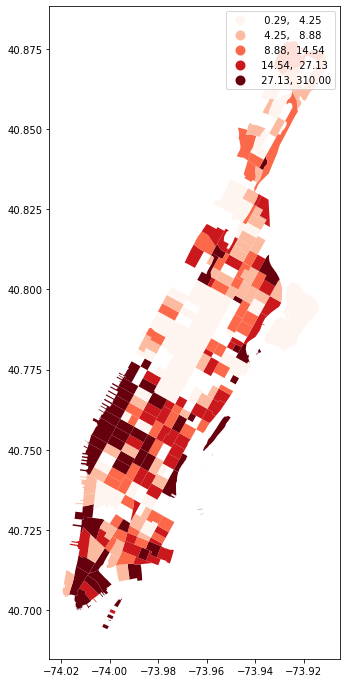

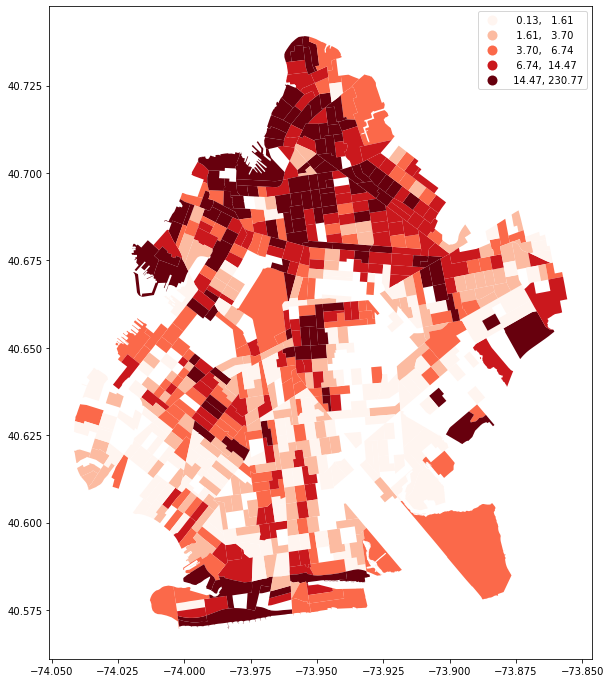

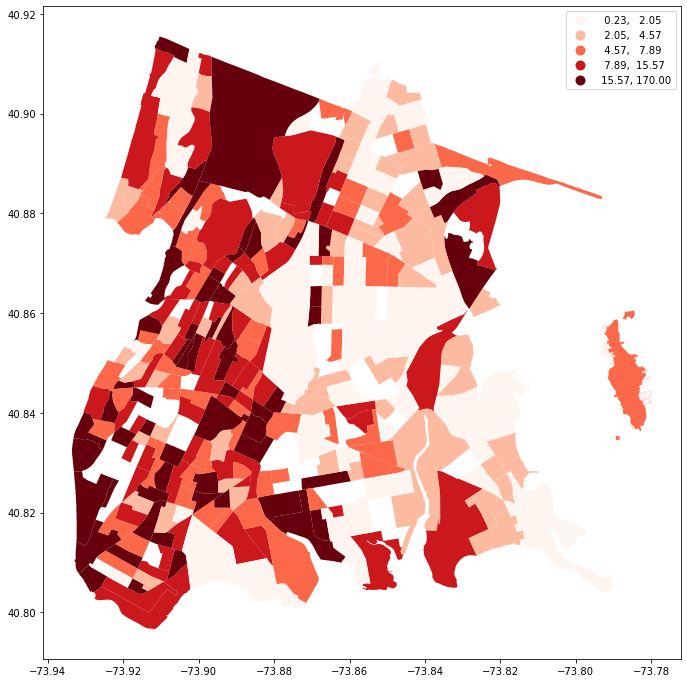

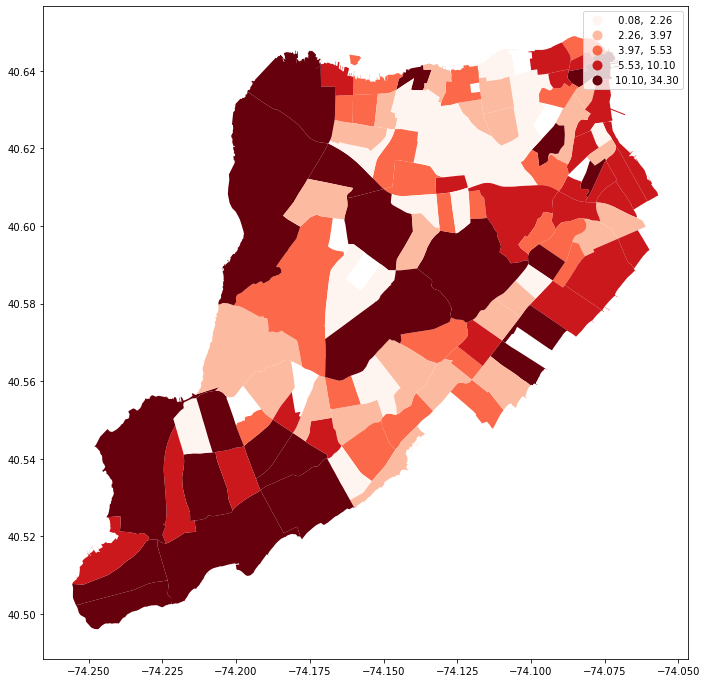

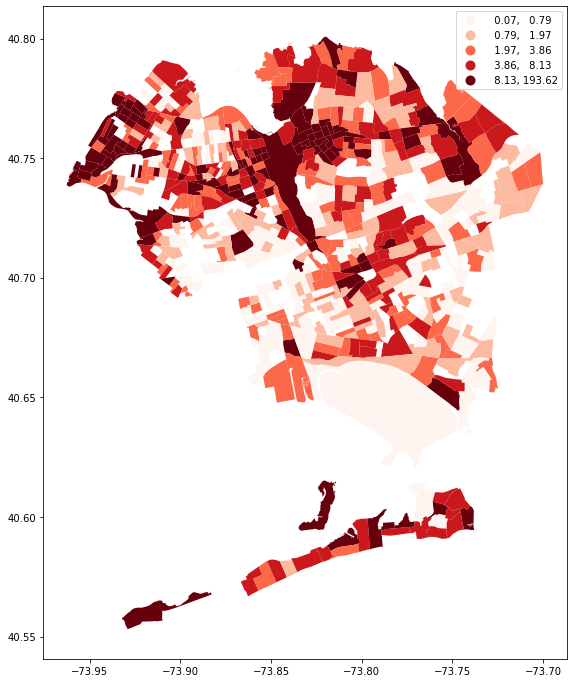

In [38]:
for borough in [mtracts, bktracts, bxtracts, sitracts, qtracts]:
    borough.plot(column='permits per 100 buildings', scheme='quantiles', cmap='Reds', legend=True, figsize=(12,12))

Top 30 Census Tracts in each borough:

In [39]:
mtracts.name='Manhattan'
bktracts.name='Brooklyn'
bxtracts.name='Bronx'
sitracts.name='Staten Island'
qtracts.name='Queens'

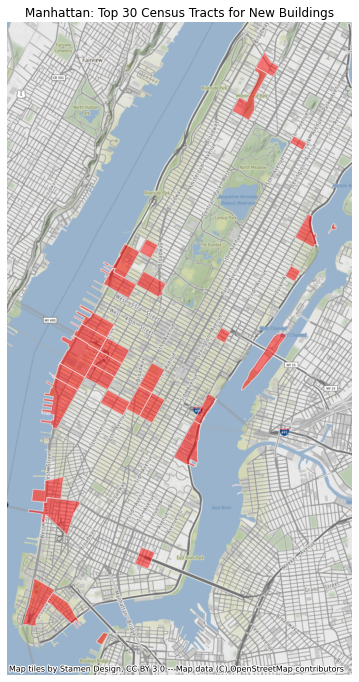

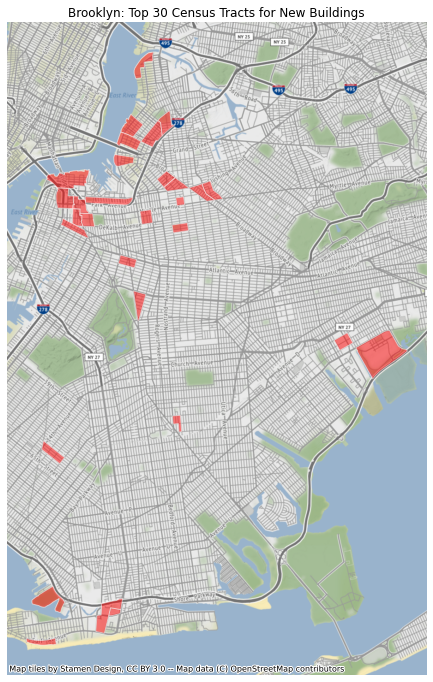

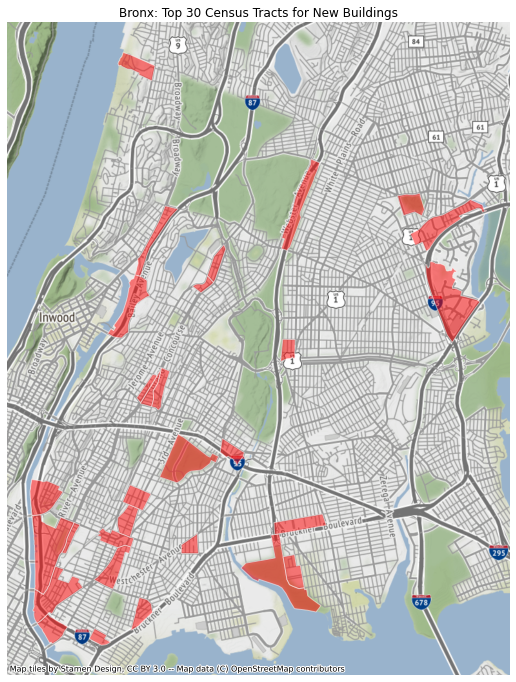

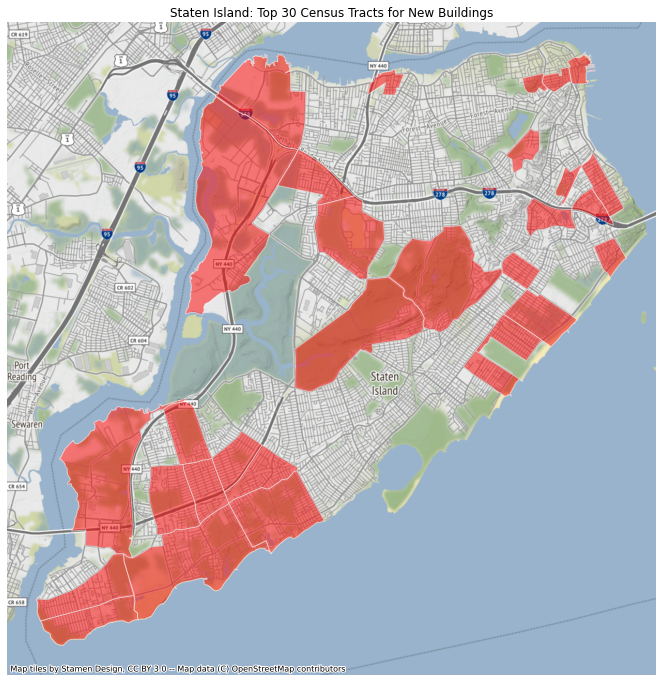

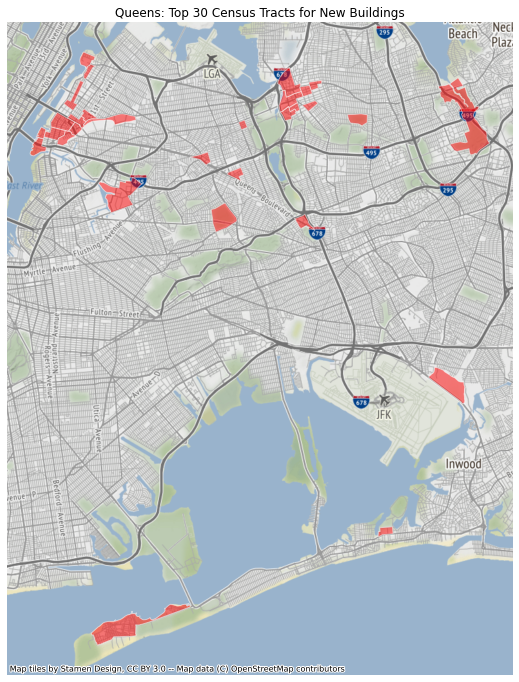

In [40]:
for borough in [mtracts, bktracts, bxtracts, sitracts, qtracts]:
    fig,ax = plt.subplots(figsize=(12,12))
    borough.to_crs(epsg=3857).sort_values(by='permits per 100 buildings', ascending=False)[:30].plot(ax=ax, alpha=.5, color='red', edgecolor='white', legend=True)
    ax.axis('off')
    ax.set_title(borough.name + ': Top 30 Census Tracts for New Buildings')
    ctx.add_basemap(ax)

The above maps show where there is the highest number of new building permits per 100 buildings.  In theory, this could be used to reflect the real estate market throughout the city.  It is interesting because many of the tracts with the highest number of new buildings are in coastal areas that will be subject to flooding.

## Performing the Spatial Autocorrelation

Importing the libraries

In [41]:
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

### Spatial Lag

Creating the spatial weights, using KNN with k=7, and row standardizing.  Then adding a new column with the spatial lag to each dataset.

In [42]:
for borough in [mtracts, bktracts, bxtracts, sitracts, qtracts]:
    wq =  lps.weights.KNN.from_dataframe(borough, k=7)
    wq.transform = 'r'
    borough['permits_per_100_lag'] = lps.weights.lag_spatial(wq, borough['permits per 100 buildings'])

/opt/conda/lib/python3.9/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


In [43]:
bktracts.sample(10)

,borough,census_tract,Shape__Area,Shape__Length,buildings_count,geometry,permits_count,permits per 100 buildings,permits_per_100_lag
368,Brooklyn,49301.0,7.300130e+05,3434.611939,12,"POLYGON ((-73.94008 40.70911, -73.94032 40.709...",4,33.333333,19.682245
398,Brooklyn,51700.0,2.020313e+06,6225.178753,177,"POLYGON ((-73.95065 40.72171, -73.95271 40.720...",18,10.169492,21.066623
487,Brooklyn,70202.0,5.462929e+07,44429.934707,89,"POLYGON ((-73.88770 40.57807, -73.88813 40.578...",6,6.741573,7.387957
100,Brooklyn,15300.0,1.619490e+06,5188.381191,417,"POLYGON ((-73.97721 40.66818, -73.97772 40.667...",15,3.597122,4.096327
403,Brooklyn,52600.0,1.823527e+06,6736.724751,359,"POLYGON ((-73.96480 40.63324, -73.96568 40.632...",8,2.228412,3.967782
263,Brooklyn,36100.0,1.524421e+06,6064.700108,226,"POLYGON ((-73.91487 40.67054, -73.91554 40.670...",18,7.964602,5.418908
305,Brooklyn,41100.0,1.433633e+06,4966.647922,409,"POLYGON ((-73.90418 40.68859, -73.90488 40.687...",54,13.202934,9.632361
42,Brooklyn,6800.0,1.996656e+06,5840.803227,525,"POLYGON ((-74.02291 40.63612, -74.02324 40.635...",12,2.285714,2.754879
367,Brooklyn,49200.0,1.780103e+06,8133.972613,375,"POLYGON ((-73.96879 40.63926, -73.96872 40.639...",22,5.866667,1.934769
34,Brooklyn,5800.0,2.080303e+06,6098.167994,557,"POLYGON ((-74.02957 40.61984, -74.02821 40.619...",9,1.615799,1.961379


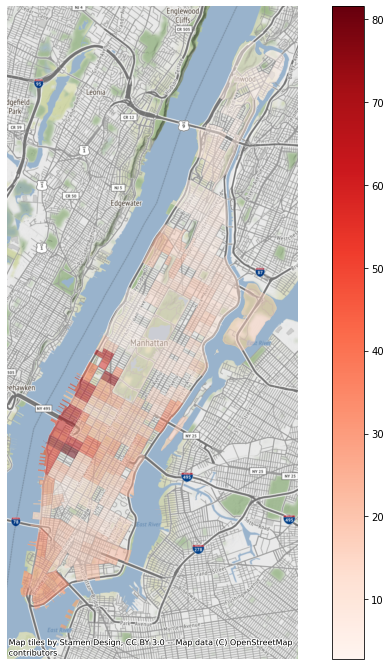

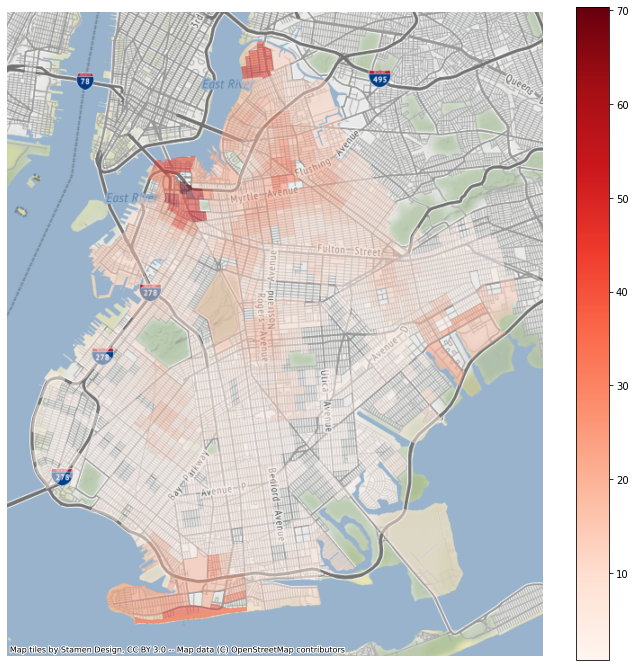

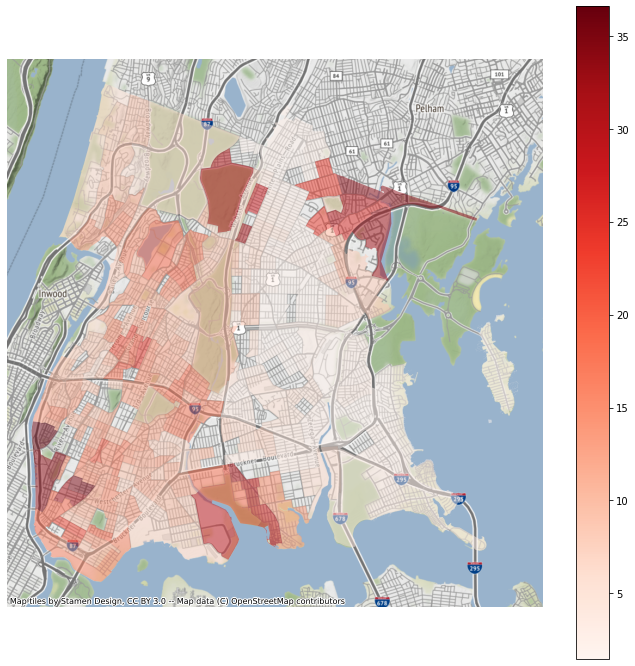

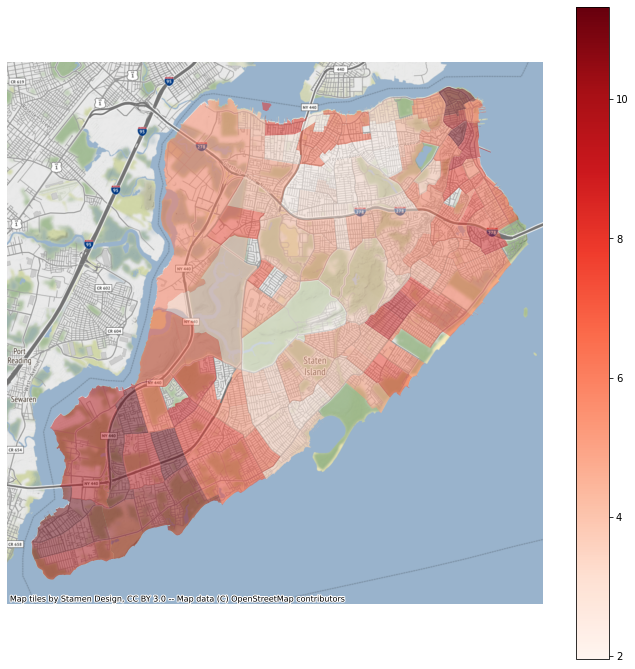

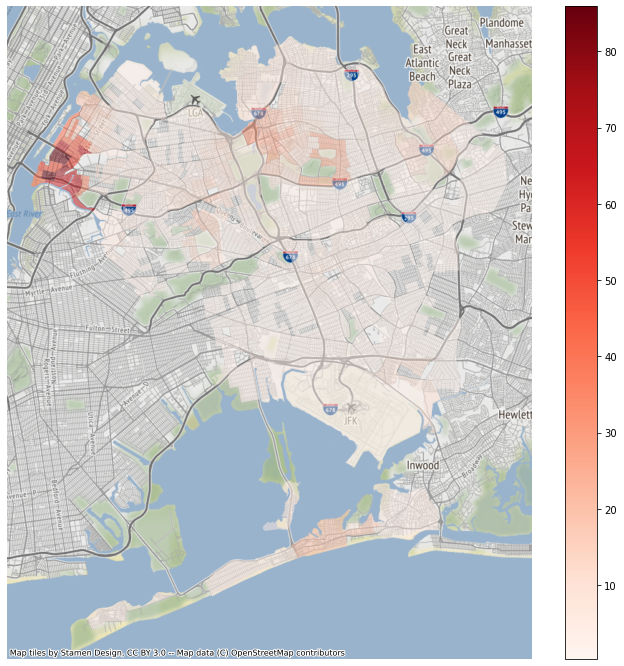

In [44]:
for borough in [mtracts, bktracts, bxtracts, sitracts, qtracts]:
    fig,ax = plt.subplots(figsize=(12,12))
    borough.to_crs(epsg=3857).plot(ax=ax, column='permits_per_100_lag', alpha=.5, cmap='Reds', legend=True)
    ax.axis('off')
    ctx.add_basemap(ax)

### Moran Analysis

In [45]:
for borough in [mtracts, bktracts, bxtracts, sitracts, qtracts]:
    wq =  lps.weights.KNN.from_dataframe(borough, k=7)
    wq.transform = 'r'
    y = borough['permits per 100 buildings']
    moran = Moran(y, wq)
    print(borough.name + ' Moran I value:')
    print(moran.I)

Manhattan Moran I value:
0.17535162739444313
Brooklyn Moran I value:
0.24783104853370014
Bronx Moran I value:
0.06042617746618062
Staten Island Moran I value:
0.06060245504517705
Queens Moran I value:
0.30877944550465725


/opt/conda/lib/python3.9/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


Manhattan Moran I value:
0.17535162739444313


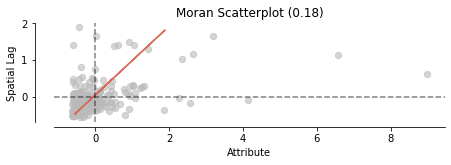

Brooklyn Moran I value:
0.24783104853370014


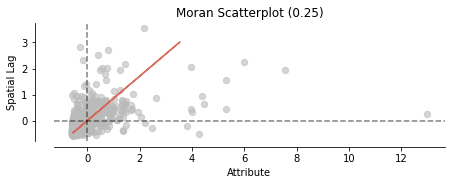

Bronx Moran I value:
0.06042617746618062


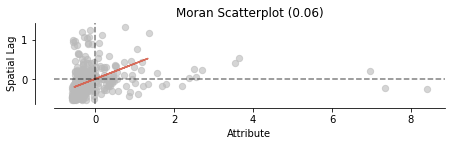

Staten Island Moran I value:
0.06060245504517705


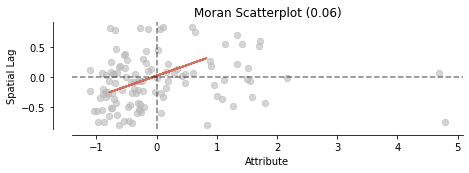

/opt/conda/lib/python3.9/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


Queens Moran I value:
0.30877944550465725


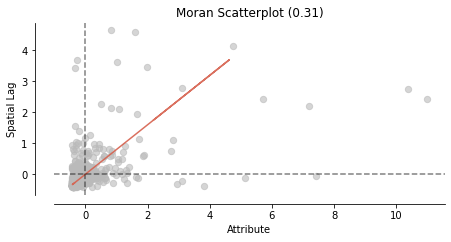

In [46]:
for borough in [mtracts, bktracts, bxtracts, sitracts, qtracts]:
    wq =  lps.weights.KNN.from_dataframe(borough, k=7)
    wq.transform = 'r'
    y = borough['permits per 100 buildings']
    moran = Moran(y, wq)
    print(borough.name + ' Moran I value:')
    print(moran.I)
    fig, ax = moran_scatterplot(moran, aspect_equal=True)
    plt.show()

/opt/conda/lib/python3.9/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


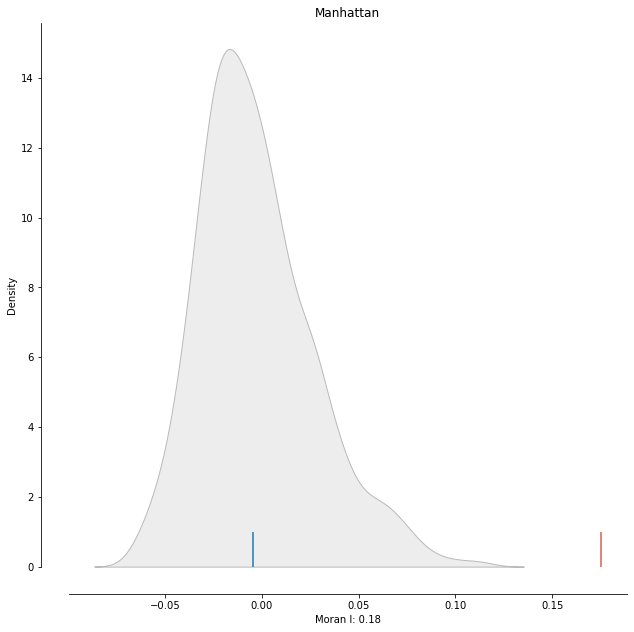

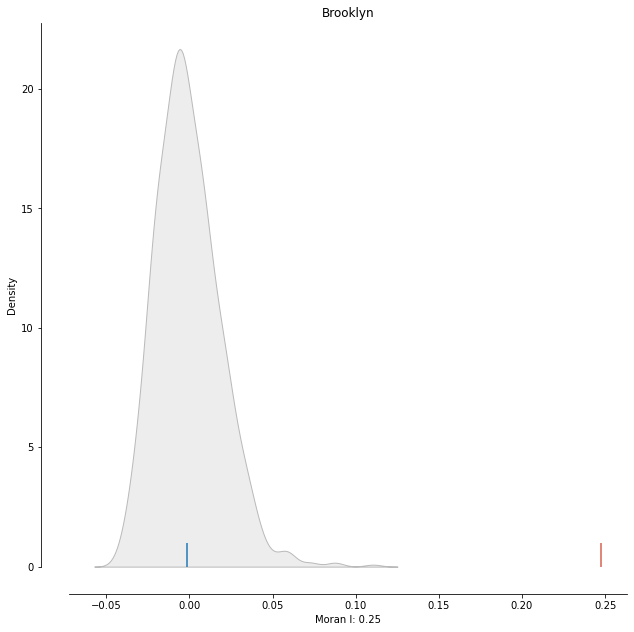

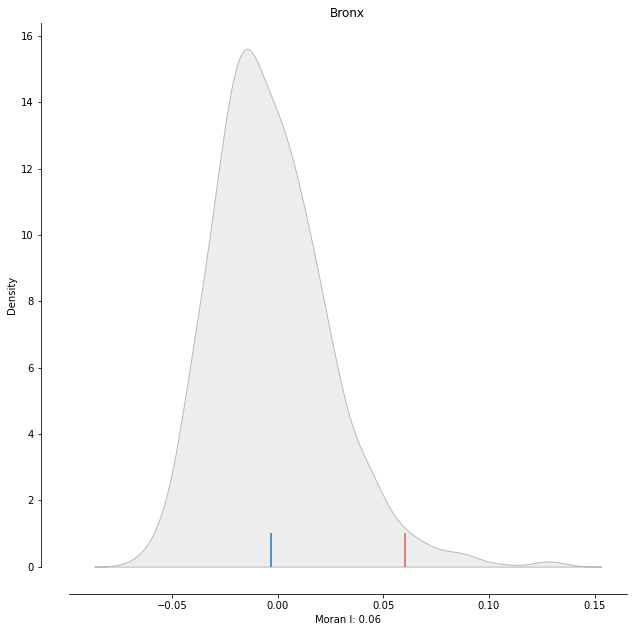

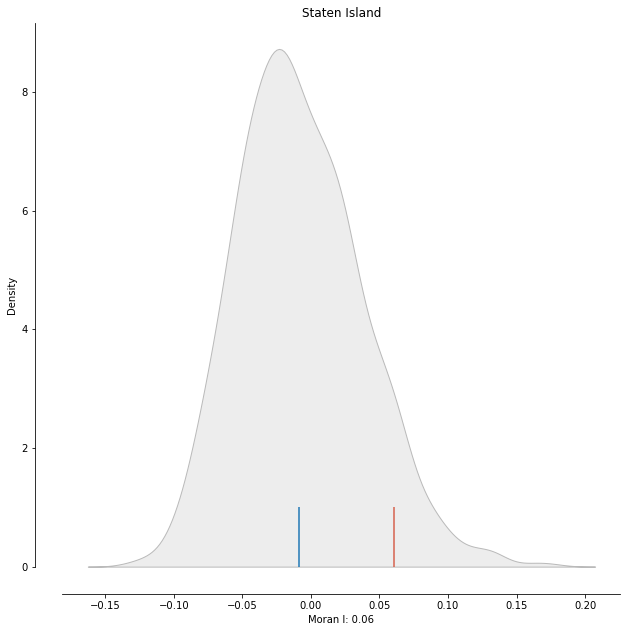

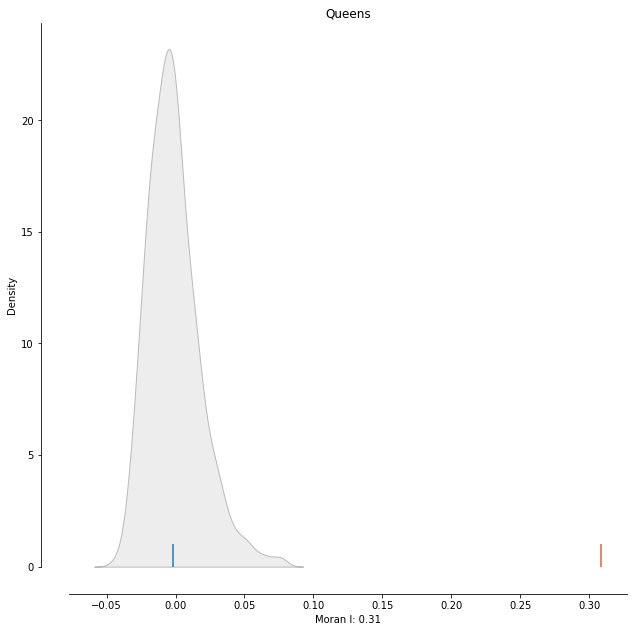

In [47]:
for borough in [mtracts, bktracts, bxtracts, sitracts, qtracts]:
    wq =  lps.weights.KNN.from_dataframe(borough, k=7)
    wq.transform = 'r'
    y = borough['permits per 100 buildings']
    moran = Moran(y, wq)
    fig,ax = plt.subplots(figsize=(10,10))
    plot_moran_simulation(moran,aspect_equal=False, ax=ax)
    ax.set_title(borough.name)

In [48]:
for borough in [mtracts, bktracts, bxtracts, sitracts, qtracts]:
    wq =  lps.weights.KNN.from_dataframe(borough, k=7)
    wq.transform = 'r'
    y = borough['permits per 100 buildings']
    moran = Moran(y, wq)
    print(borough.name + ' p_sim:')
    print(moran.p_sim)

Manhattan p_sim:
0.001
Brooklyn p_sim:
0.001
Bronx p_sim:
0.022
Staten Island p_sim:
0.069
Queens p_sim:
0.001


/opt/conda/lib/python3.9/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


The above Moran analyses show that the patterns we see are likely not random in Manhattan, Brooklyn, and Queens, and potentially random in Staten Island and the Bronx (although still on the side of not being random).

### Local Indicators of Spatial Autocorrelation

Now, we will try to determing where the clusters are occuring - this stage should be where we see if sea level rise is having any impact.

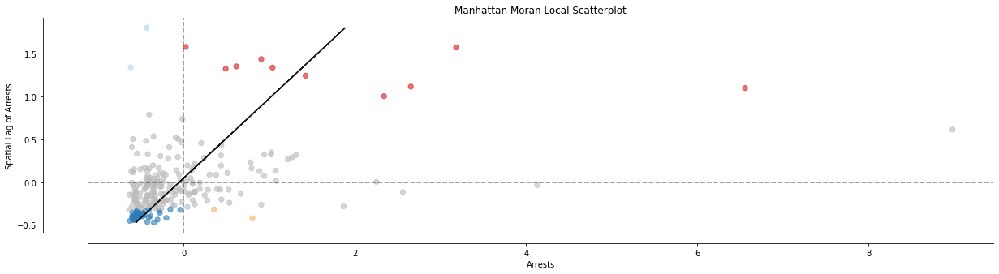

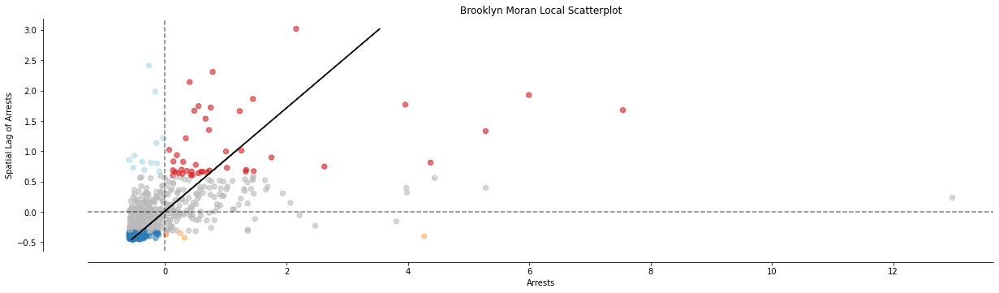

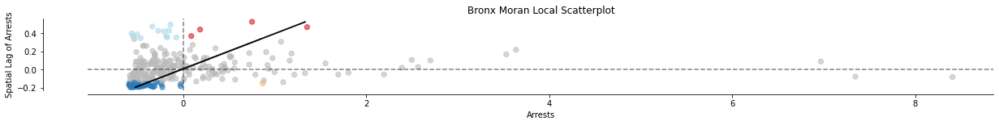

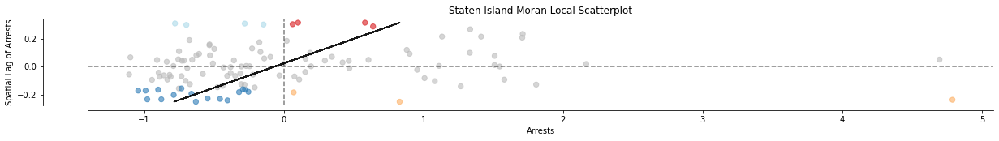

/opt/conda/lib/python3.9/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


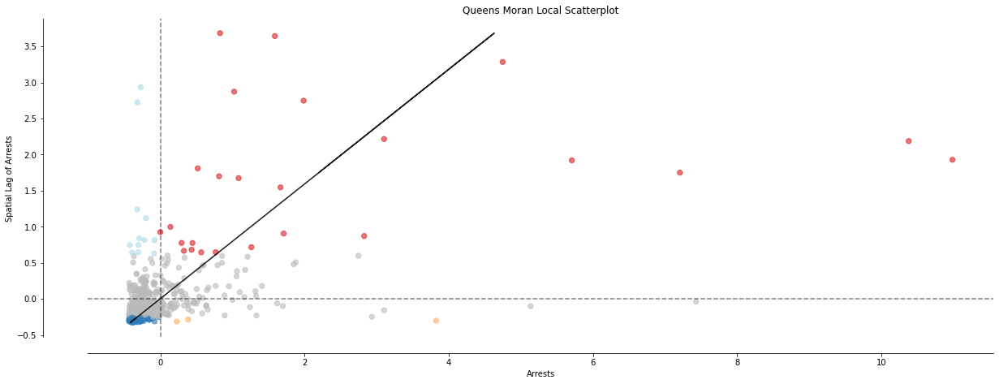

In [49]:
for borough in [mtracts, bktracts, bxtracts, sitracts, qtracts]:
    wq =  lps.weights.KNN.from_dataframe(borough, k=7)
    wq.transform = 'r'
    y = borough['permits per 100 buildings']
    moran = Moran(y, wq)
    lisa = esda.moran.Moran_Local(y, wq)
    
    fig, ax = plt.subplots(figsize=(20,12))
    moran_scatterplot(lisa, ax=ax, p=0.05)
    ax.set_xlabel("Arrests")
    ax.set_ylabel('Spatial Lag of Arrests')
    ax.set_title(borough.name + ' Moran Local Scatterplot')

    plt.show()

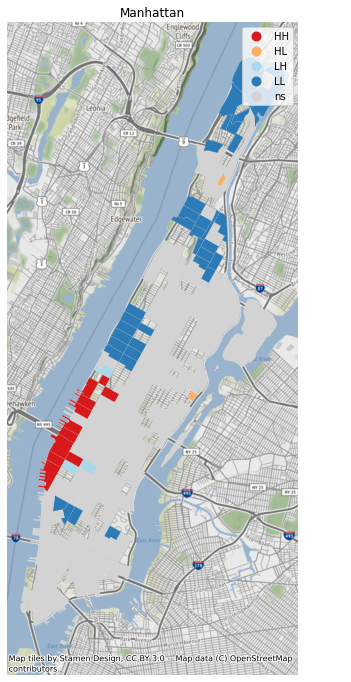

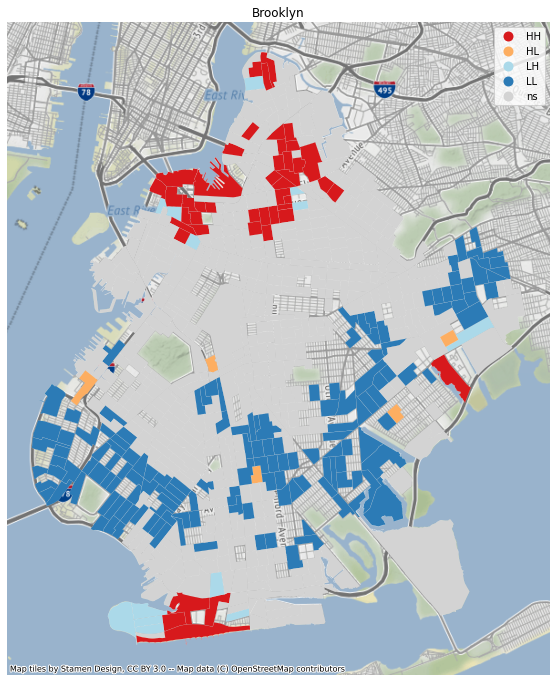

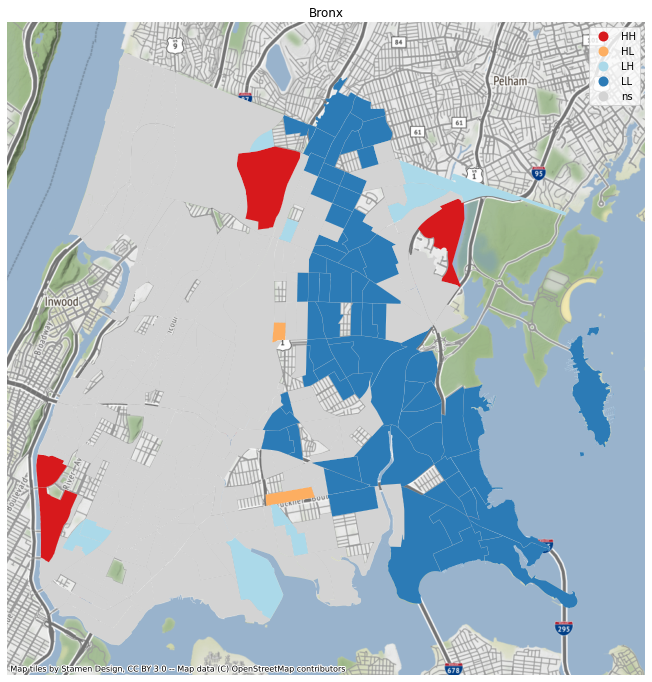

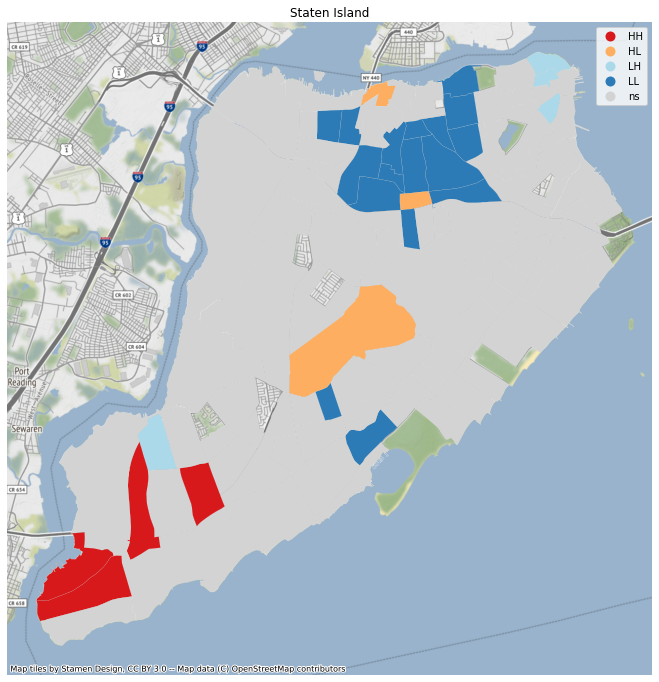

/opt/conda/lib/python3.9/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


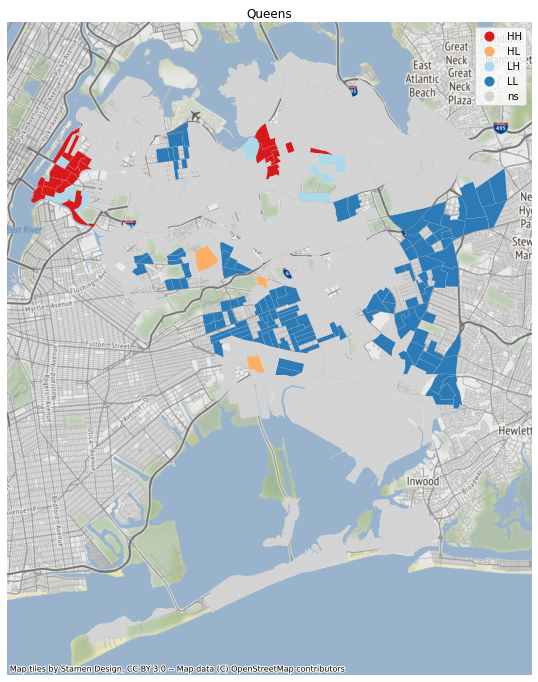

In [50]:
for borough in [mtracts, bktracts, bxtracts, sitracts, qtracts]:
    wq =  lps.weights.KNN.from_dataframe(borough, k=7)
    wq.transform = 'r'
    y = borough['permits per 100 buildings']
    moran = Moran(y, wq)
    lisa = esda.moran.Moran_Local(y, wq)
    
    fig, ax = plt.subplots(figsize=(14,12))
    lisa_cluster(lisa, borough.to_crs(epsg=3857), p=0.05, ax=ax, alpha=1)
    ax.set_title(borough.name)
    ctx.add_basemap(ax)
    plt.show()

I did not find this analysis to be particularly helpful in the grand scheme of our projects.  We are concerned with how the coastal census tracts compare with the non-coastal census tracts, so it may be better in the future to incorporate that aspect into this analysis.  The local spatial autocorrelation seems to be more indicative of where, in general, certain factors are contributing to greater or fewer numbers of new buildings, instead of showing how census tracts in coastal areas may differ from those in non-coastal areas.

### Work Performed
Jacob - this notebook